In [2]:
import argparse
import logging
import os
import numpy as np
from numpy import fft
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms
import cv2 as cv
from patchify import patchify, unpatchify
from math import log10, sqrt

from utils.data_loading import BasicDataset
from unet import UNet
from unet_line import UNet_line
from math import cos, sin, pi
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

In [2]:
def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [3]:
# 返回实部+虚部 1760*1760图像
def p2d(arr):
    shape = arr.shape[0:2]
    new_arr = np.zeros(shape,dtype= complex)
    for i in range(shape[0]):
        for j in range(shape[1]):
            angle = (arr[i,j,1]/255*360-180)/180*pi
            modu = arr[i,j,0]
            new_arr[i,j] = modu*cos(angle)+1j*modu*sin(angle)
    return new_arr

In [4]:
def show(arr):
    plt.figure(figsize=(20,20))
    plt.imshow(arr[:,:,0],'hot')

In [5]:
def d2p_show(arr):
    new_arr = arr[:,:,0]+1j*arr[:,:,1]
    plt.figure(figsize=(20,20))
    plt.imshow(abs(new_arr),'hot')
    return new_arr

In [37]:
# 全图测试 虚部+实部
i = 235
low_address = './image_cart/low/%04d.npy'%i
high_address = './image_cart/high/%04d.npy'%i
pred_address = './image_cart/pred/%04d.npy'%i

In [38]:
# 全图测试 模长+辐角
i = 685
low_address = './image_polar/low/%04d.npy'%i
high_address = './image_polar/high/%04d.npy'%i
pred_address = './image_polar/pred/%04d.npy'%i

In [ ]:
# 全图测试 模长+辐角
i = 685
low_address = './image_polar/low/%04d.npy'%i
high_address = './image_polar/high/%04d.npy'%i
pred_address = './image_polar/pred/%04d.npy'%i

Abs loaded...
Predicting the result...


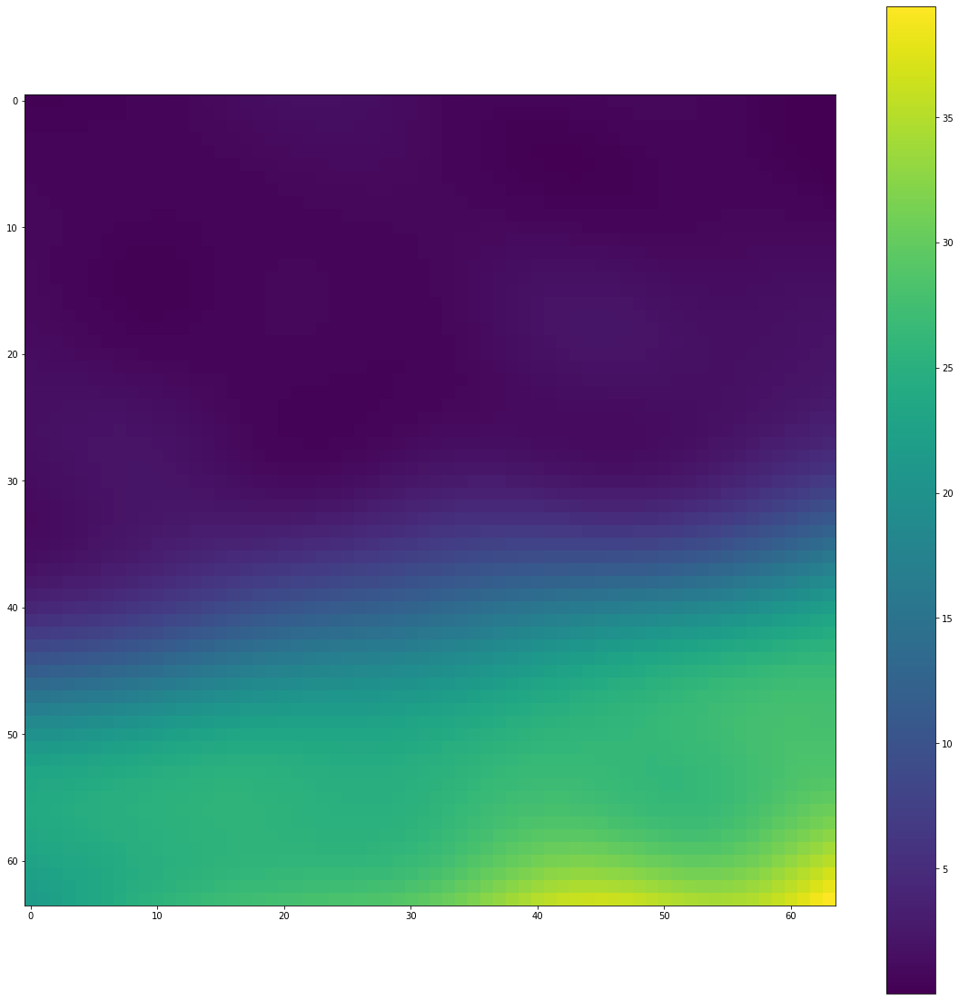

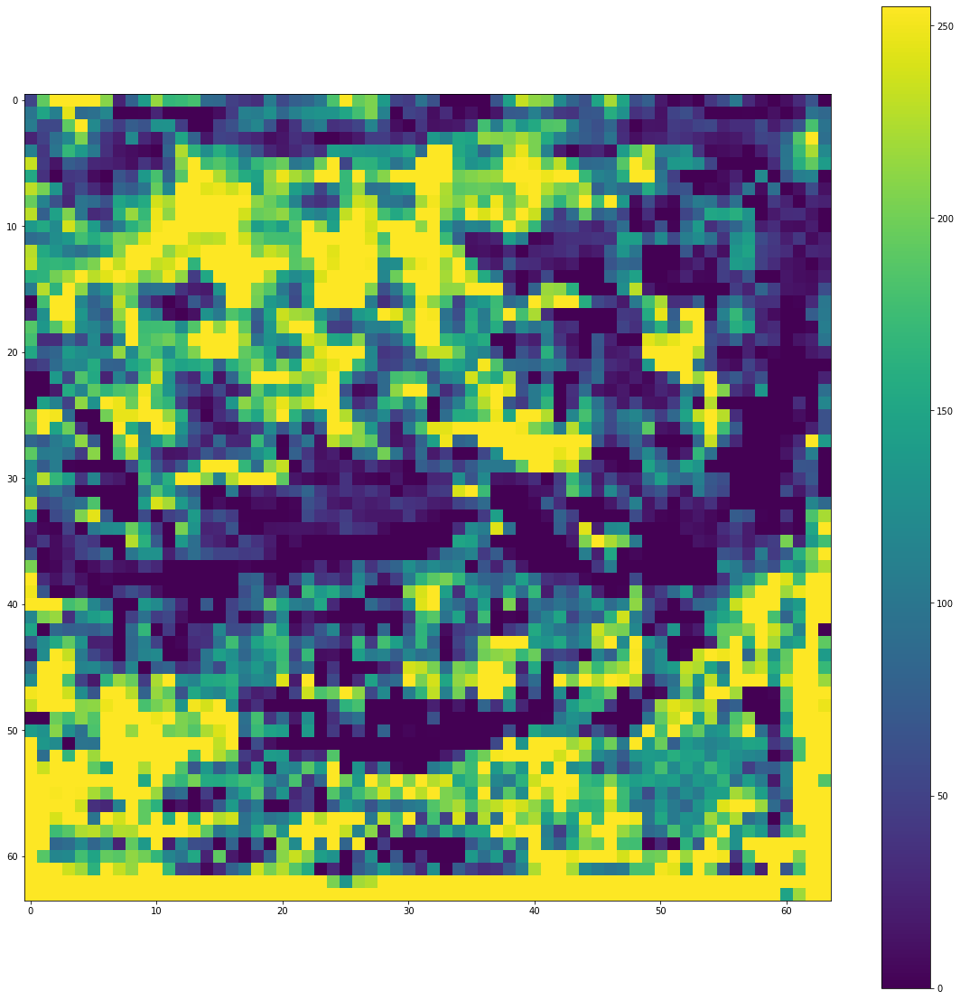

In [43]:
# 双通道测试程序
low_address = './npy/data_img.npy'
i = 48
mul_channel = np.load(low_address)[i,:,:]
plt.figure(figsize=(20,20))
plt.imshow(mul_channel)
plt.colorbar()
Abs = mul_channel[:,:][np.newaxis,np.newaxis,...]/255

device = torch.device('cuda' if torcSh.cuda.is_available() else 'cpu')
net = UNet(n_channels=1, n_classes=1, bilinear=False)
net.load_state_dict(torch.load('./MODEL_img_abs.pth', map_location=device),strict=True)


Abs_tensor = torch.as_tensor(Abs.copy()).float().contiguous()
print('Abs loaded...')

with torch.no_grad():
    print('Predicting the result...')
    masks_pred = net(Abs_tensor)
    pred_abs = masks_pred.detach().numpy()[0, 0, :, :]
plt.figure(figsize=(20,20))
plt.imshow(pred_abs,vmax=255,vmin=0)
plt.colorbar()

In [6]:
# 双通道测试程序
mul_channel = np.load(low_address)
mul_channel = mul_channel[3,:,:]
Abs = mul_channel[:,:][np.newaxis,np.newaxis,...]/255
# Angle = mul_channel[:,:,1][np.newaxis,np.newaxis,...]/255

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = UNet(n_channels=1, n_classes=1, bilinear=False)
net.load_state_dict(torch.load('./Completed Model/MODEL_abs.pth', map_location=device),strict=True)

Abs_tensor = torch.as_tensor(Abs.copy()).float().contiguous()
# Angle_tensor = torch.as_tensor(Angle.copy()).float().contiguous()
print('Abs loaded...')
with torch.no_grad():
    print('Predicting the result...')
    masks_pred = net(Abs_tensor)
    pred_abs = masks_pred.detach().numpy()[0, 0, :, :]

# net = UNet(n_channels=1, n_classes=1, bilinear=False)
# net.load_state_dict(torch.load('./Completed Model/MODEL_abs.pth', map_location=device),strict=True)
# print('Angle loaded...')
# with torch.no_grad():
#     print('Predicting the result...')
#     masks_pred = net(Angle_tensor)
#     pred_angle = masks_pred.detach().numpy()[0, 0, :, :]

# pred = np.zeros((1760,1760,2))
# pred[:,:,0] = pred_abs
# pred[:,:,1] = pred_angle
# np.save(pred_address, pred)
plt.figure(figsize=(20,20))
plt.imshow(pred_abs)
plt.colorbar()

In [3]:
# 单通道测试程序
img_cart = np.load(low_address)
img_cart = img_cart.transpose((2,0,1))
img_cart = img_cart[np.newaxis,...] / 255

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = UNet(n_channels=2, n_classes=2, bilinear=False)
net.load_state_dict(torch.load('./Completed Model/MODEL_abs.pth', map_location=device),strict=True)

img_tensor = torch.as_tensor(img_cart.copy()).float().contiguous()
print('Image loaded...')
print('Predicting the result...')

with torch.no_grad():
    masks_pred = net(img_tensor)
    pred_cart = masks_pred.detach().numpy()[0, :, :, :]
    pred = pred_cart.transpose((1,2,0))
    print(pred.shape)
    np.save(pred_address, pred)
print('Image is predicted ✧≖ ◡ ≖✿')

Image loaded...
Predicting the result...
(1760, 1760, 2)
Image is predicted ✧≖ ◡ ≖✿


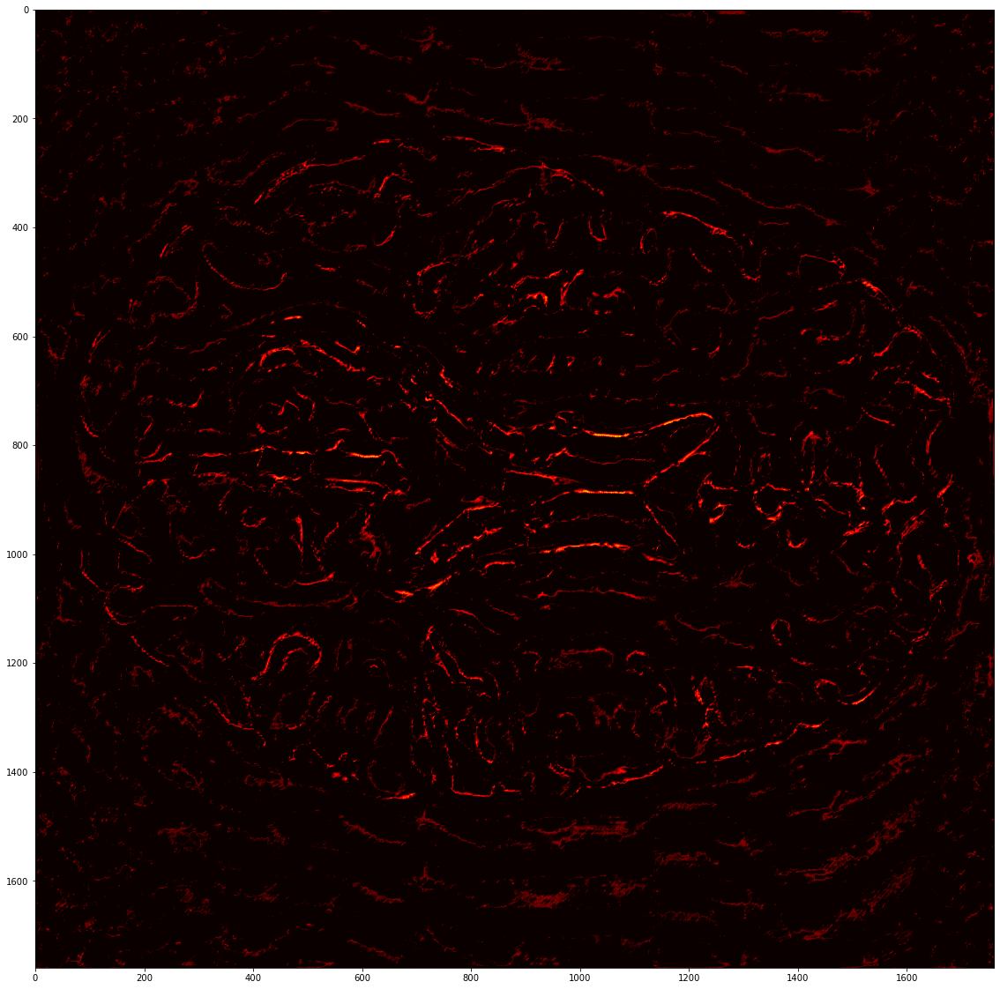

In [6]:
# low = np.load(low_address)
# low = show(low)
# print(low.shape)
# plt.imsave('./result_whole/low.jpg',low[:,:,0])
pred = np.load(pred_address)
show(pred)
# plt.figure(figsize=(20,20))
# plt.imshow(pred[:,:,0], cmap='hot')
# plt.imsave('./result_whole/pred.jpg',pred[:,:,0])

# high = np.load(high_address)
# plt.figure(figsize=(20,20))
# plt.imshow(high[:,:,1], cmap='hot')
# pred = show(pred)
# plt.imsave('./result_whole/pred.jpg',pred[:,:,0])
# high = np.load(high_address)
# high = show(high)
# plt.imsave('./result_whole/high.jpg',high[:,:,0])

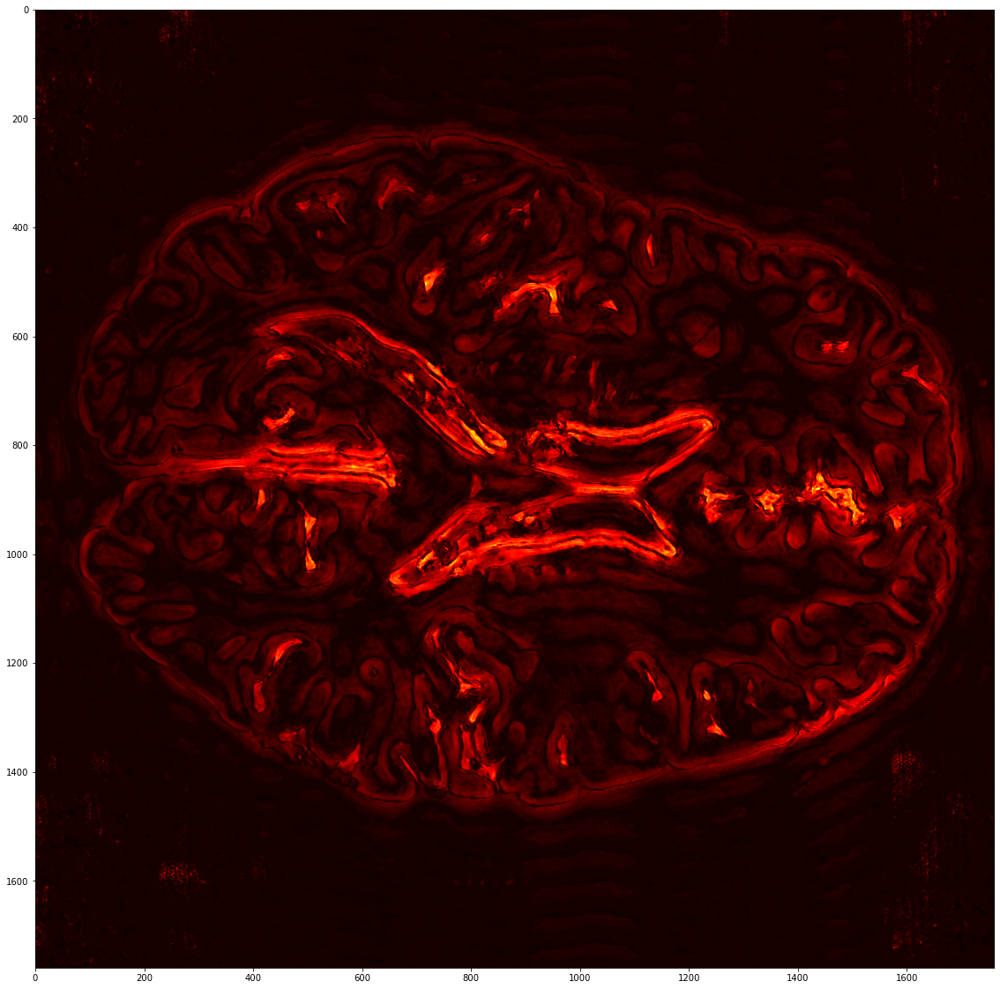

In [32]:
show(pred)
pred2 = p2d(pred)

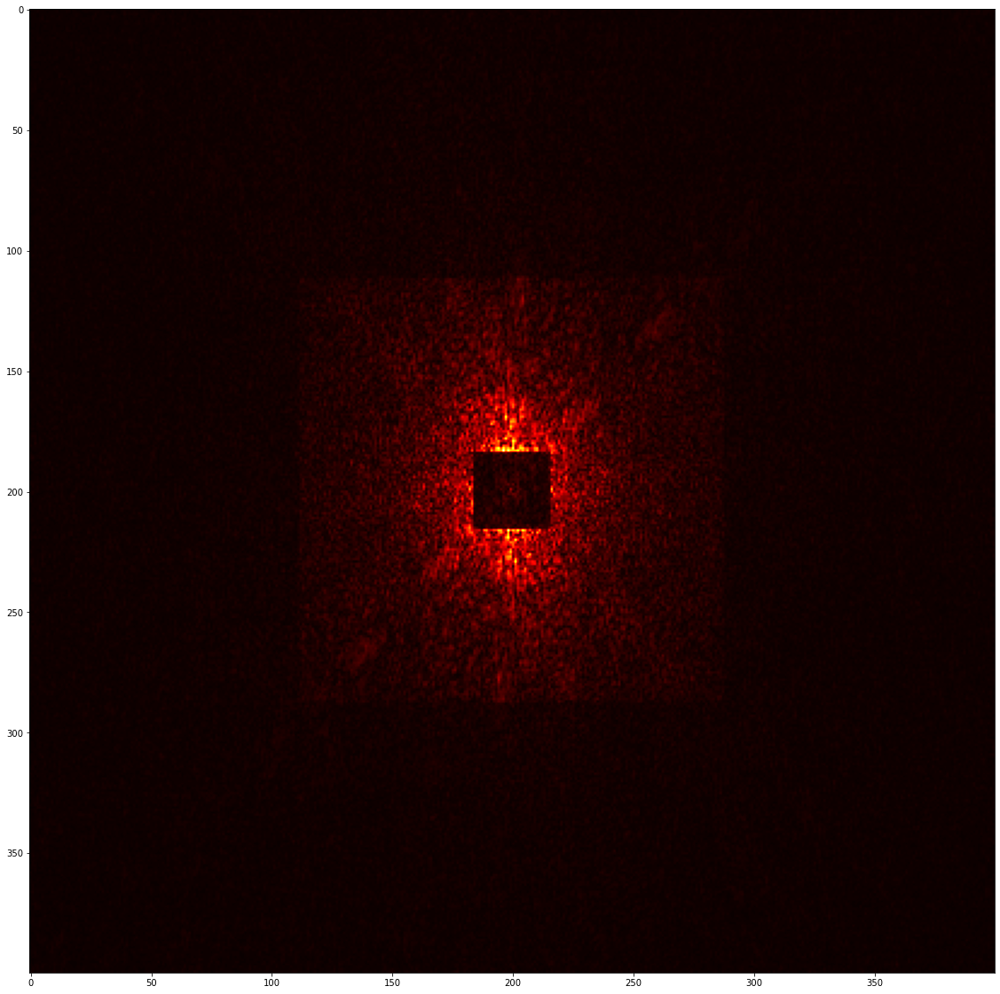

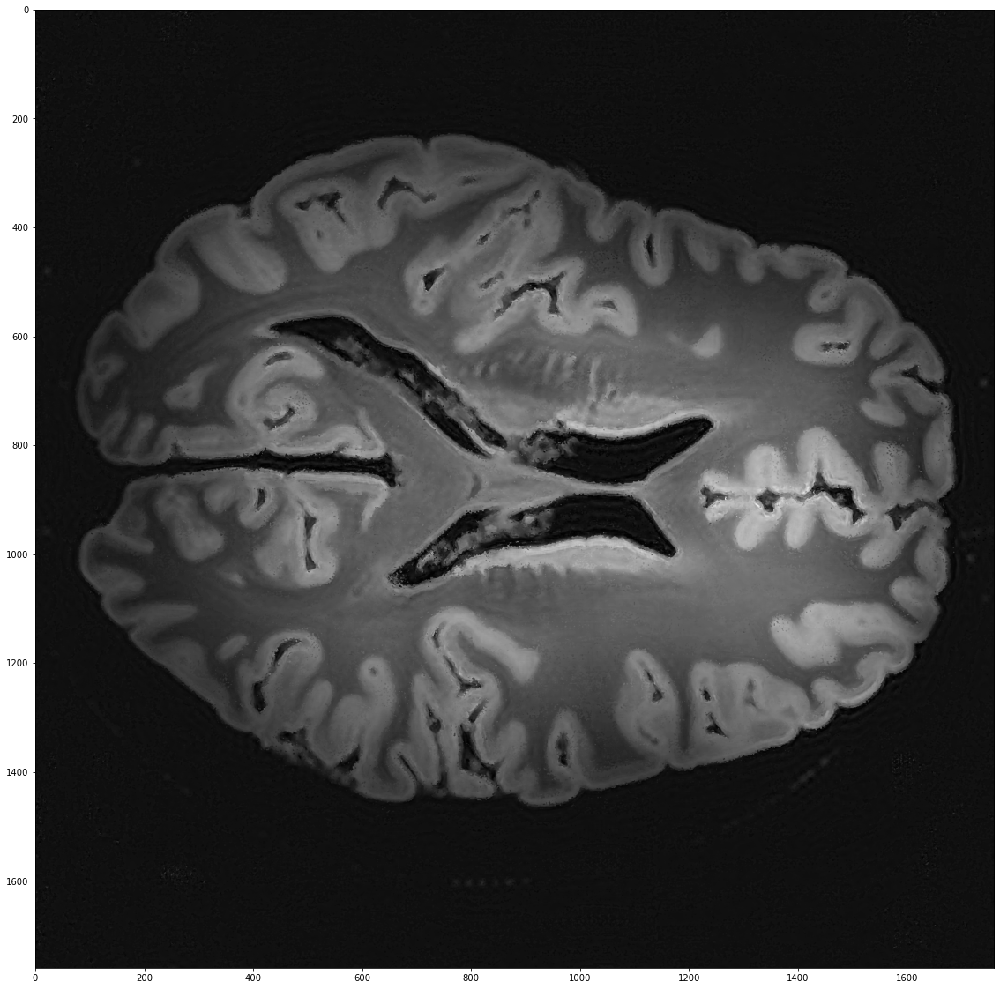

In [35]:
i = 400
pred_fft = fft.fftshift(fft.fft2(pred2))
plt.figure(figsize=(20,20))
plt.imshow(abs(pred_fft)[881-i//2:881+i//2,881-i//2:881+i//2],cmap='hot')

center_address = './data_center/176/0685.npy'
center = np.load(center_address)
i = 176
pred_fft[881-i//2:881+i//2,881-i//2:881+i//2] = center[:,:,0]+1j*center[:,:,1]
 
plt.imshow(img_pred, cmap='gray')
plt.imsave('./result_whole/whole.jpg',img_pred)

In [21]:
def smooth(arr, k):
    length = len(arr)
    new_arr = [0.0]*length
    for i in range(length):
        if i-k<0:
            new_arr[i] = np.mean(arr[:i+k])
        if i+k>=length:
            new_arr[i] = np.mean(arr[i-k:])
        else:
            new_arr[i] = np.mean(arr[i-k:i+k])
    return new_arr

In [19]:
a0=np.load('./loss/p_loss_abs.npy')
a1=np.load('./loss/p_loss_abs1.npy')

b0=np.load('./loss/v_loss_abs.npy')
b1=np.load('./loss/v_loss_abs1.npy')

p_loss = np.append(a0,a1)
v_loss = np.append(b0,b1)

c0=np.load('./loss/p_loss_angle.npy')
c1=np.load('./loss/p_loss_angle1.npy')

d0=np.load('./loss/v_loss_angle.npy')
d1=np.load('./loss/v_loss_angle1.npy')

p_loss1 = np.append(c0,c1)
v_loss1 = np.append(d0,d1)

In [2]:
loss_cart_p = np.load('./loss/p_loss_angle1.npy')
loss_cart_v = np.load('./loss/v_loss_angle1.npy')
plt.figure(figsize=(20,10))
plt.title("Training loss for cart")
plt.plot(loss_cart_p)
plt.figure(figsize=(20,10))
plt.title("Validation loss for cart")
plt.plot(loss_cart_v)

FileNotFoundError: [Errno 2] No such file or directory: './loss/p_loss_angle1.npy'

In [8]:
from scipy.io import loadmat
arr = loadmat('zp.mat')['xzp']

In [10]:
np.save('data_img.npy',arr)

In [29]:
img = np.load('./T2_data/new_image.npy')

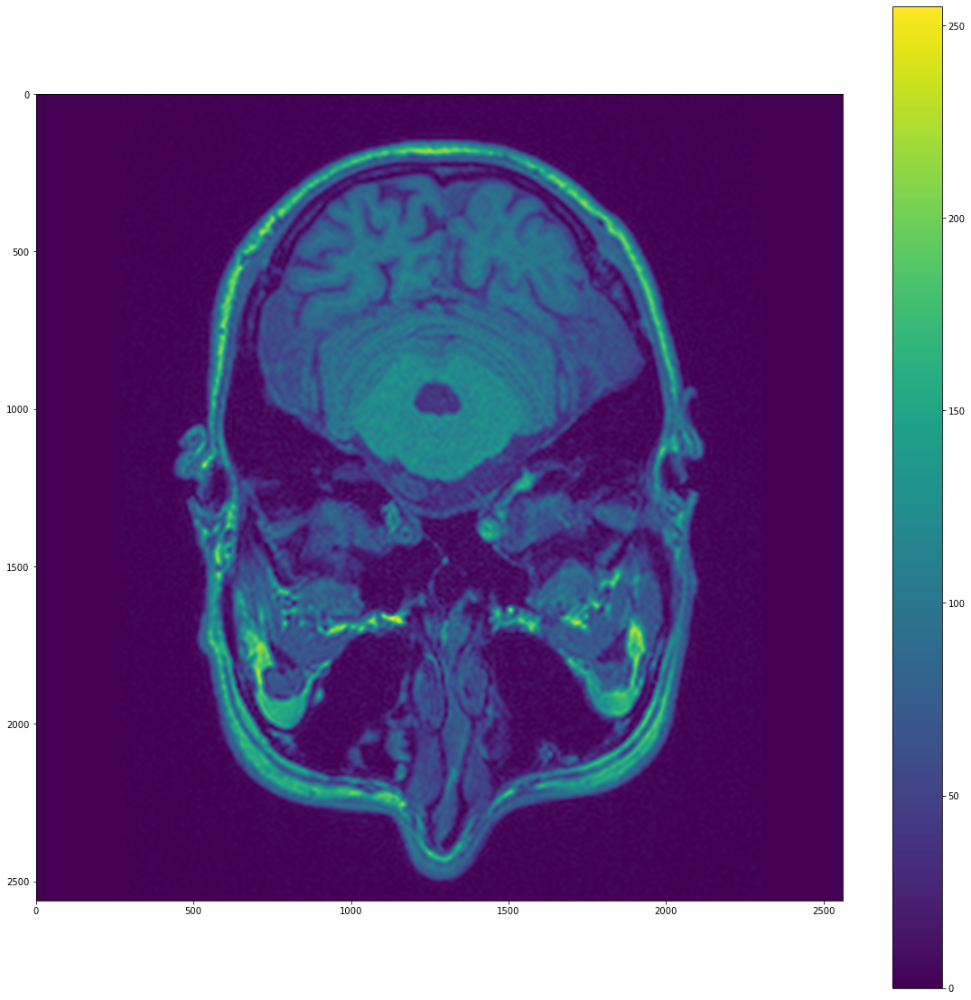

In [31]:
plt.figure(figsize=(20,20))
plt.imshow(abs(img))
plt.colorbar()

In [44]:
img = np.load('old_ori.npy')

253.50105667114258


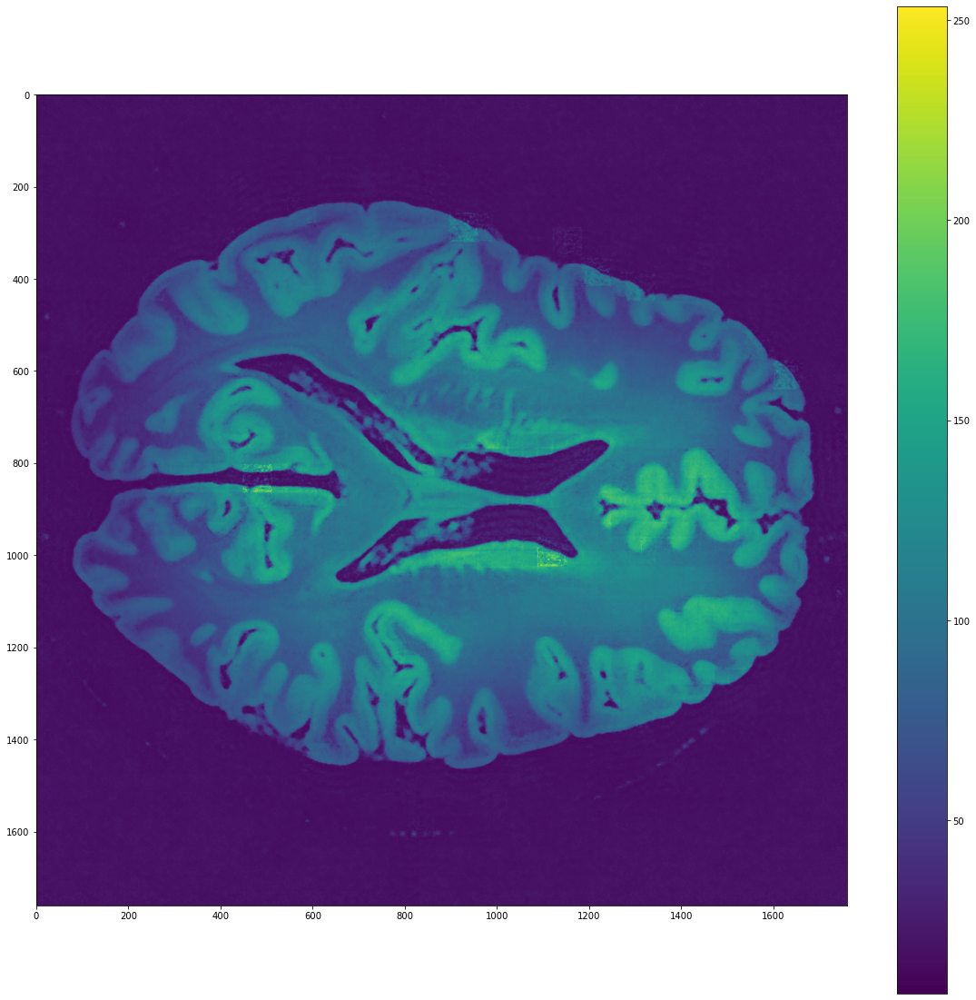

In [47]:
plt.figure(figsize=(20,20))
plt.imshow(img)
plt.colorbar()
print(np.max(img))

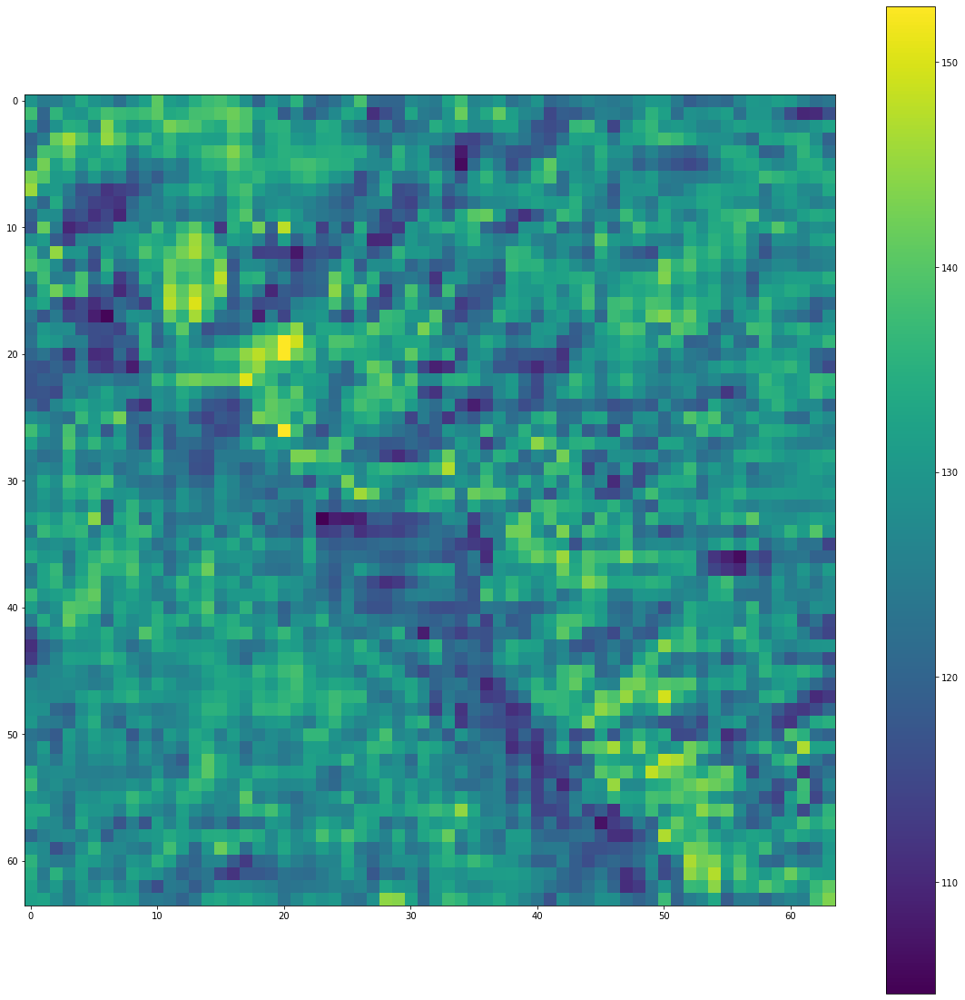

In [4]:
addr= './data/data_double_cart_64/real/high/0500.npy'
pat = np.load(addr)
plt.figure(figsize=(20,20))
plt.imshow(pat)
plt.colorbar()

In [10]:
real_part = np.load('./T2_data/new_image_real.npy')

(1760, 1760)


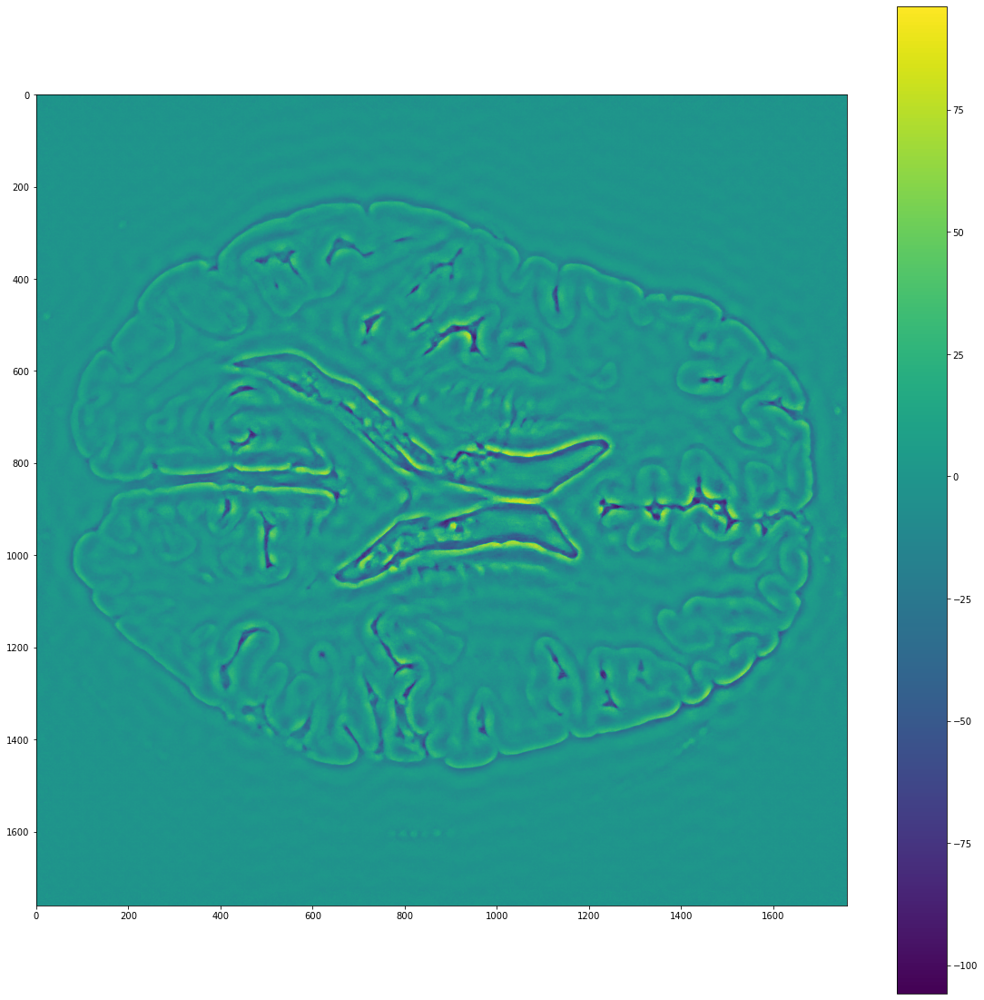

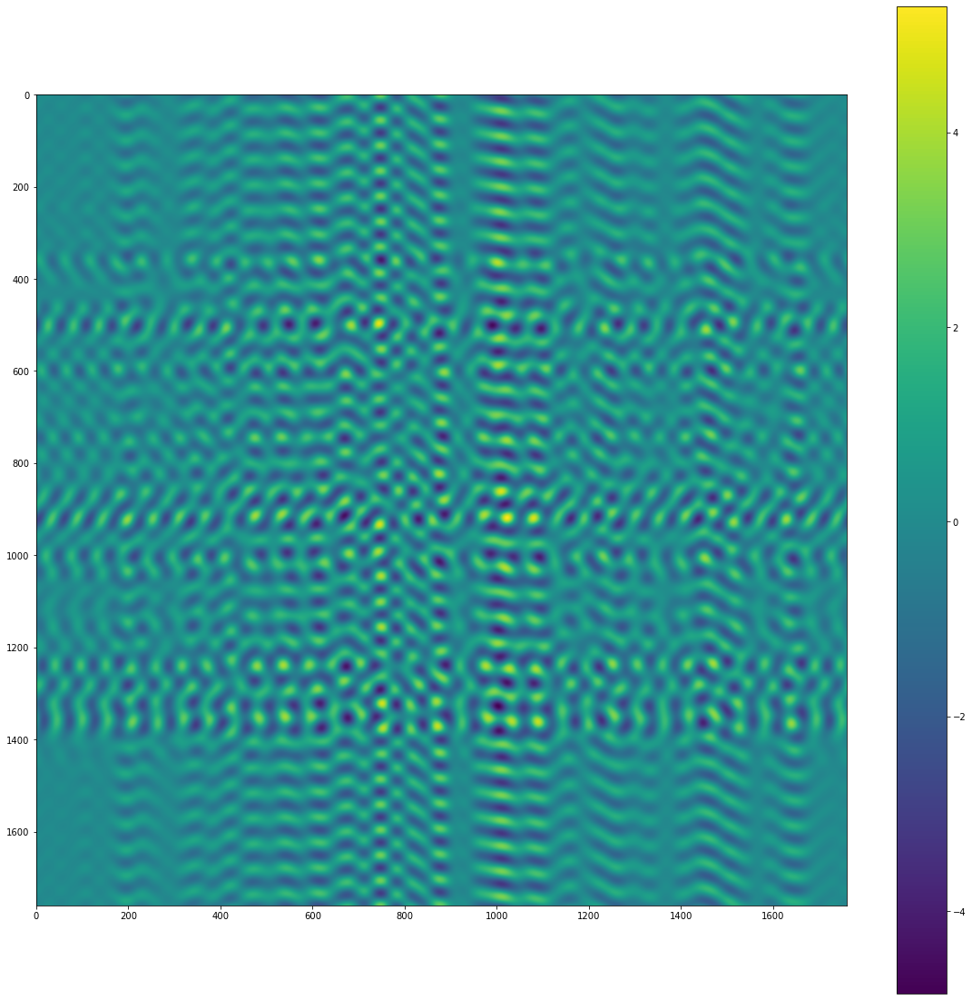

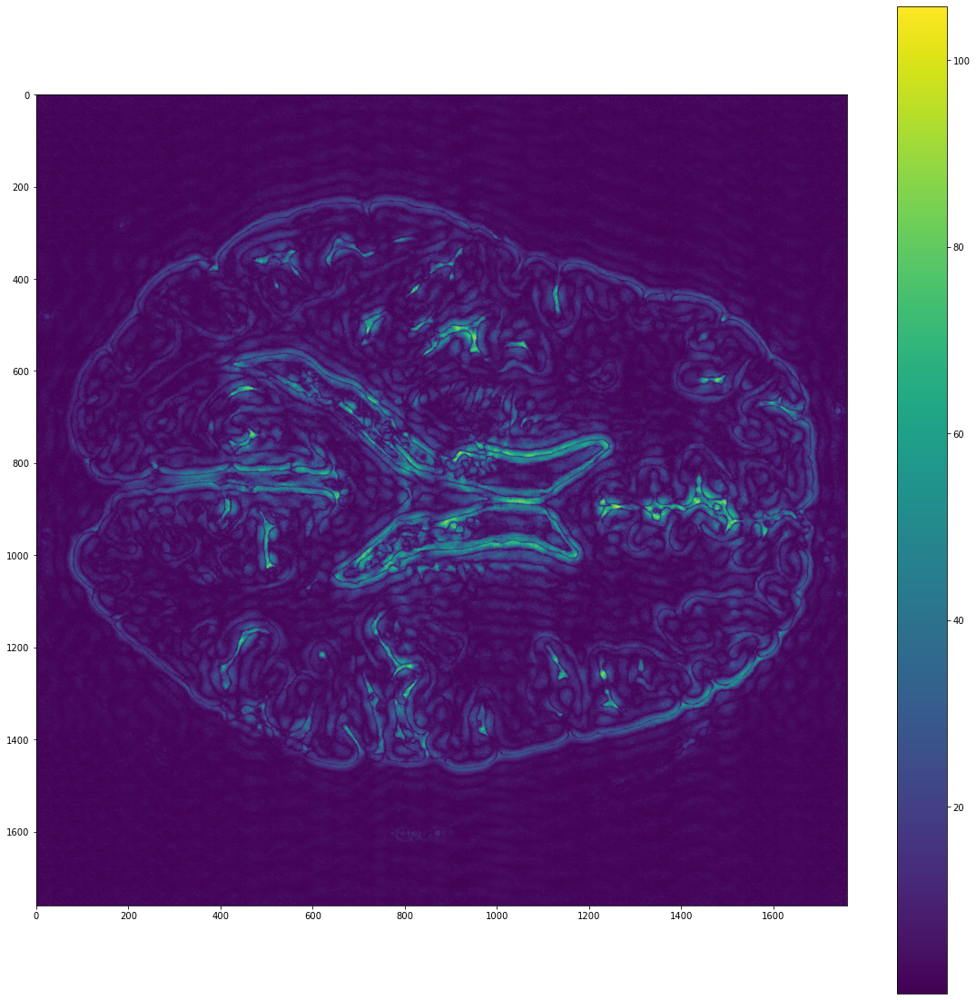

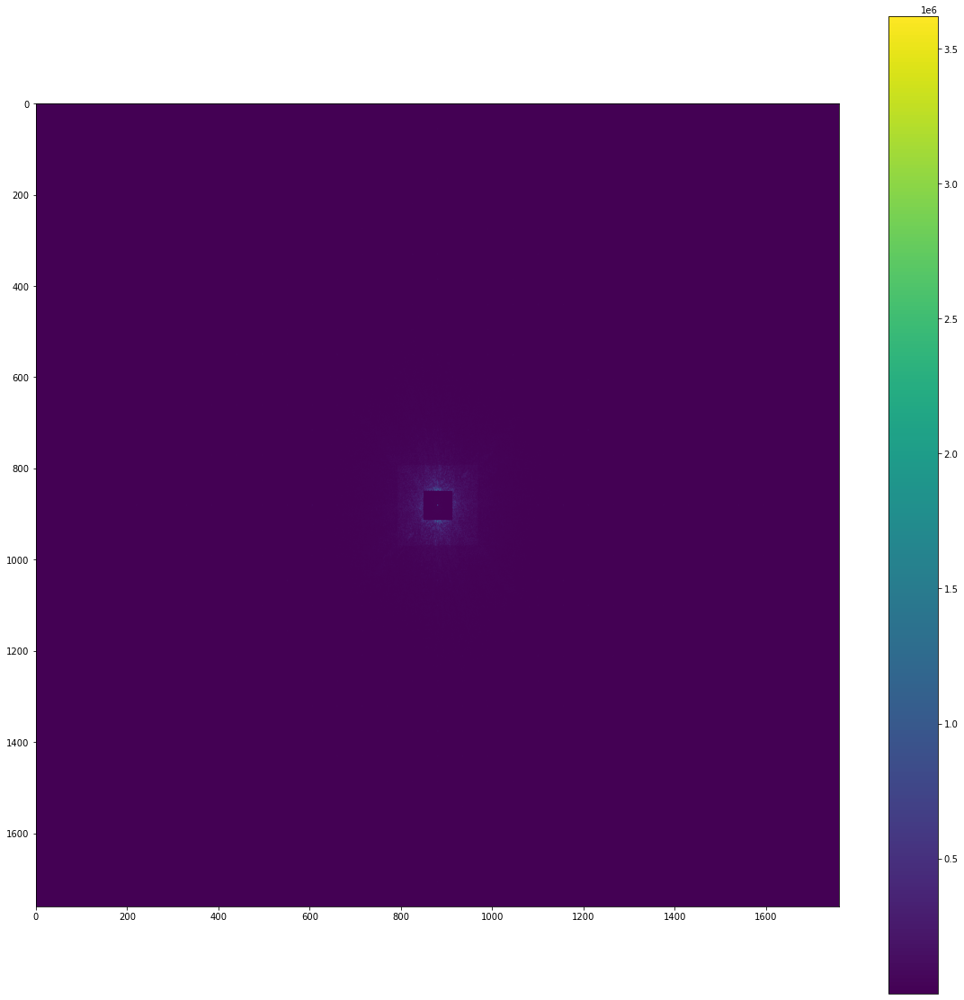

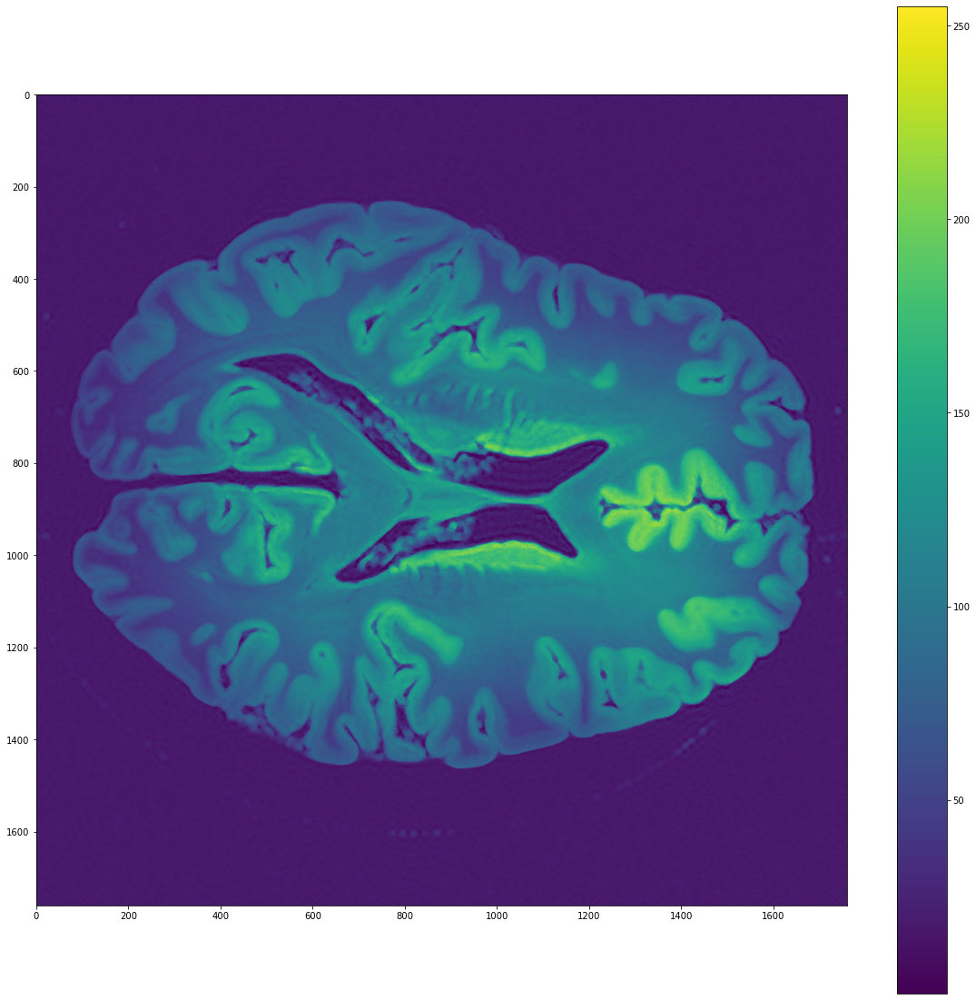

In [32]:
plt.figure(figsize=(20,20))
plt.imshow(real_part)
plt.colorbar()
print(real_part.shape)
imag_part =np.load('./image/image_double_cart_64/imag/high/0685.npy')
plt.figure(figsize=(20,20))
plt.imshow(imag_part)
plt.colorbar()


whole_img = real_part+1j*imag_part
plt.figure(figsize=(20,20))
plt.imshow(abs(whole_img))
plt.colorbar()
plt.imsave('./pred.jpg',abs(whole_img))

center=np.load('./data/data_center/0685.npy')

fft_img = fft.fftshift(fft.fft2(whole_img))
plt.figure(figsize=(20,20))
plt.imshow(abs(fft_img))
plt.colorbar()

w=176
fft_img[881-w//2:881+w//2,881-w//2:881+w//2] = center
fft_img = fft.fftshift(fft_img)
pred_img = fft.ifft2(fft_img)
plt.figure(figsize=(20,20))
plt.imshow(abs(pred_img),vmax=255)
plt.colorbar()
plt.imsave('./img.jpg',abs(pred_img),vmax=255)

In [4]:
def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr
def bounds_hzf(upleft, hunit, wunit):
    up = upleft[0]
    left = upleft[1]
    down = up + hunit
    right = left + wunit
    return up, down, left, right
def getdeno_hzf(hbound, wbound, hlocate, wlocate, ratio):
    hdist = min(hlocate+1, hbound-hlocate)
    wdist = min(wlocate+1, wbound-wlocate)
    mulhw = hdist*wdist
    return min(mulhw, min(hdist,wdist)*ratio, ratio**2)
def patchify(img, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    height, width = img.shape
    if not goback:
        hamount, wamount = int((height-hsize)/hstep)+1, int((width-wsize)/wstep)+1
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = img[u:d, l:r]
    else:
        newh, neww = height+hsize-hstep, width+wsize-wstep
        extend_img = np.zeros((newh, neww))
        extend_img[0:height, 0:width] = img[:, :]
        extend_img[height:newh, 0:width] = img[0:(newh-height), :]
        extend_img[0:height, width:neww] = img[:, 0:(neww-width)]
        extend_img[height:newh, width:neww] = img[0:(newh-height), 0:(neww-width)]
        hamount, wamount = int(height/hstep), int(width/wstep)
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = extend_img[u:d, l:r]
    return all_patches

def unpatchify(pch, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    hamount, wamount = pch.shape[0], pch.shape[1]
    if not goback:
        height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
        merged_img = np.zeros((height, width))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    else:
        height, width = int(hamount*hstep), int(wamount*wstep)
        hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
        merged_img = np.zeros((height, width))
        for i in range(0, hamount_true):
            for j in range(0, wamount_true):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    
    blockh, blockw, ratio = int(height/hstep), int(width/wstep), int(hsize/hstep)
    for ij in range(0, blockh):
        for ji in range(0, blockw):
            uu, dd, ll, rr = bounds_hzf((ij*hstep, ji*wstep), hstep, wstep)
            merged_img[uu:dd, ll:rr] = merged_img[uu:dd, ll:rr] / getdeno_hzf(blockh, blockw, ij, ji, ratio)
    return merged_img

(157, 157, 64, 64)


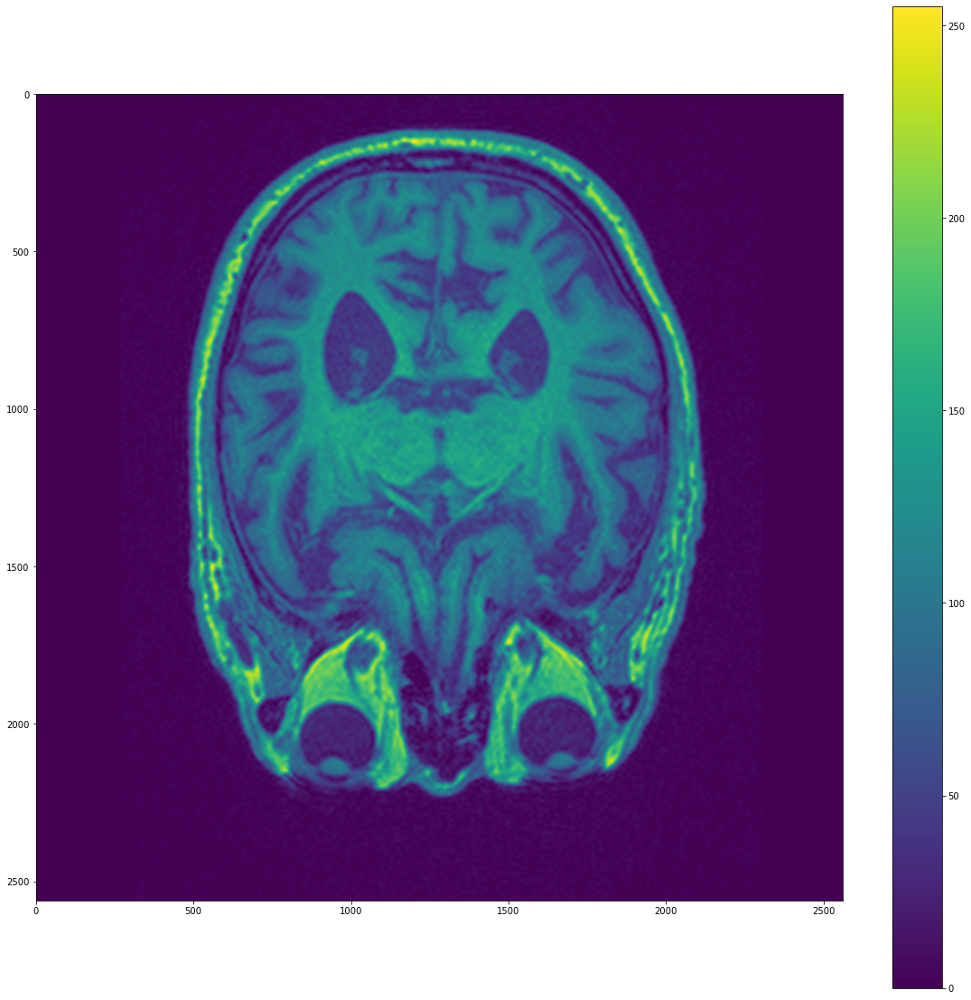

In [5]:
low_path = './T2_data/new_image24.npy'
low = np.abs(np.load(low_path))
low = low/np.max(low)*255
plt.figure(figsize=(20,20))
plt.imshow(low)
plt.colorbar()
patch_set = patchify(low,64,64,16,16,goback=0)
shape = patch_set.shape
print(patch_set.shape)

In [32]:
print(np.max(patch_set),np.min(patch_set))

255.0 0.0


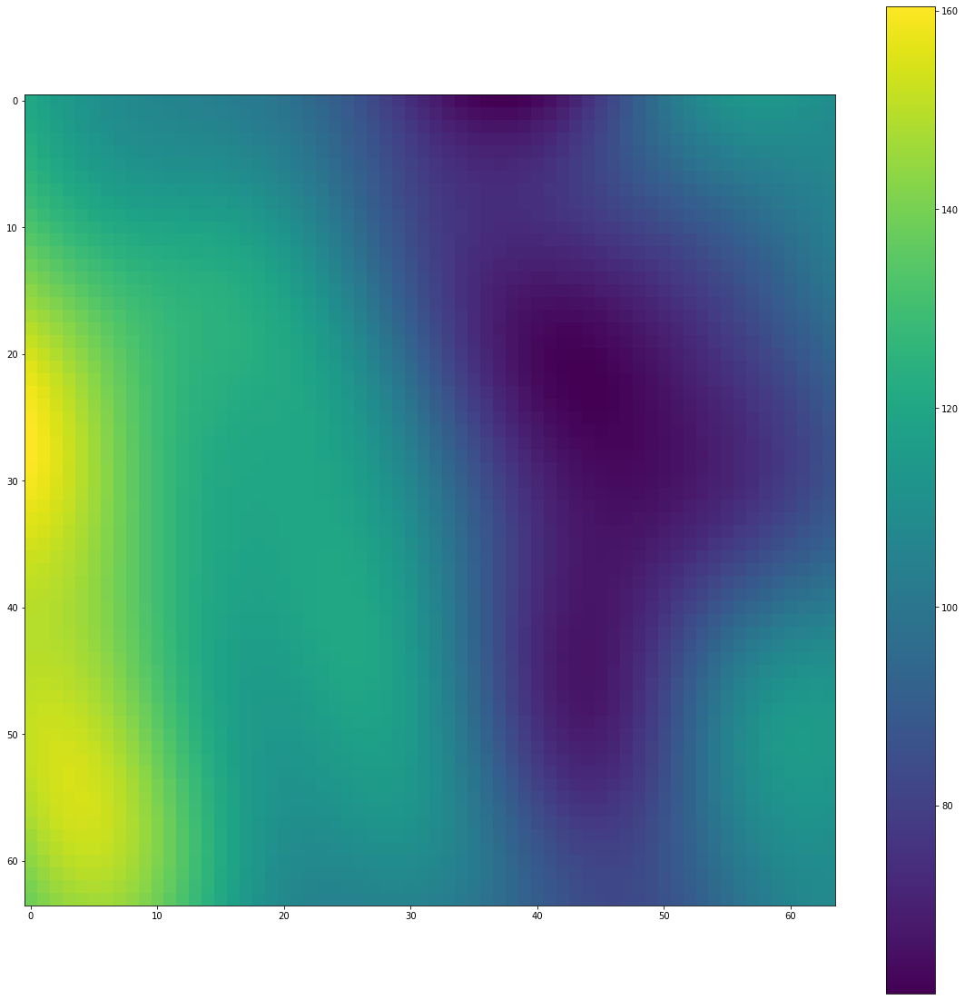

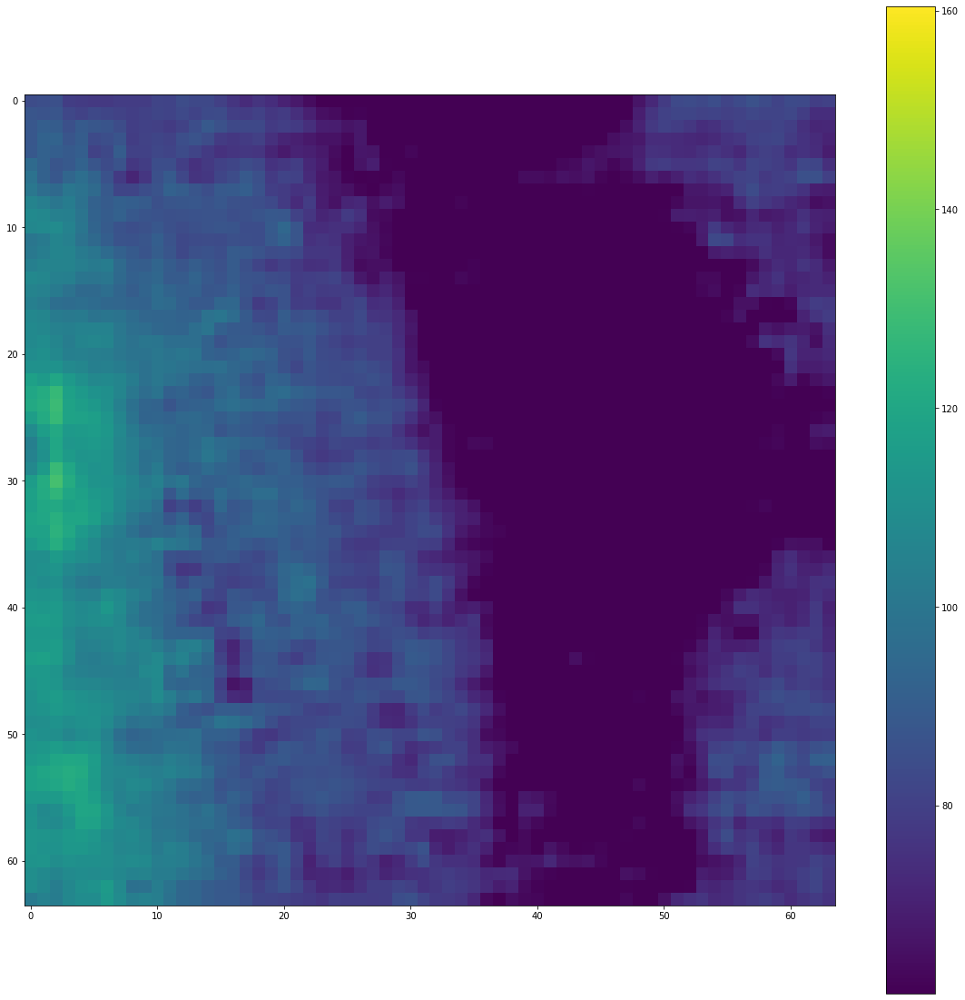

In [24]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = UNet(n_channels=1, n_classes=1, bilinear=False)
net.load_state_dict(torch.load('./checkpoint/checkpoint_epoch8.pth', map_location=device),strict=True)

pat = patch_set[97,77,:,:]
plt.figure(figsize=(20,20))
plt.imshow(pat)
plt.colorbar()
PAT = pat[np.newaxis,np.newaxis,...] / 255.0
pat_tensor = torch.as_tensor(PAT.copy()).float().contiguous()
with torch.no_grad():
    masks_pred = net(pat_tensor)
    pred_pat = masks_pred.detach().numpy()[0, 0, :, :]
    plt.figure(figsize=(20,20))
    plt.imshow(pred_pat,vmax=np.max(pat),vmin=np.min(pat))
    plt.colorbar()

In [61]:
# p_loss = np.load('./loss/p_loss_edge_real.npy')
# v_loss = np.load('./loss/v_loss_edge_real.npy')
p_loss = np.load('./loss/p_ori.npy')
v_loss = np.load('./loss/v_ori.npy')

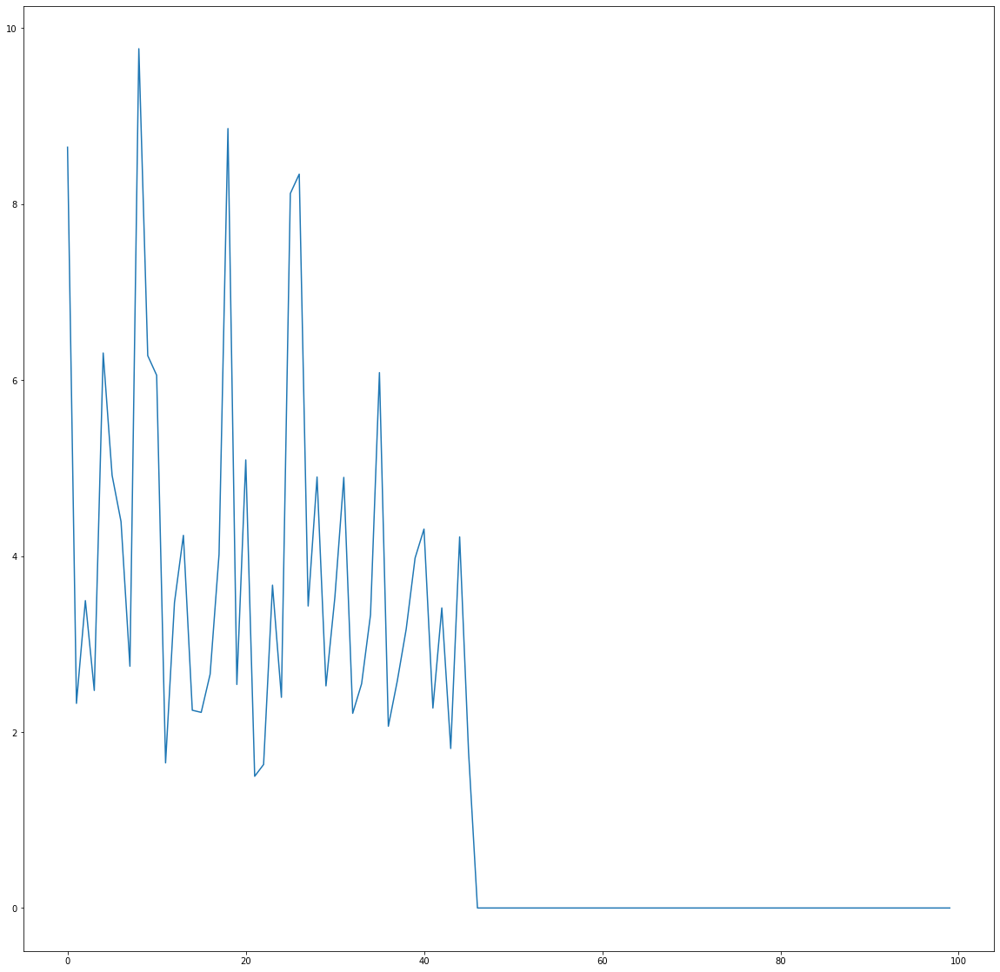

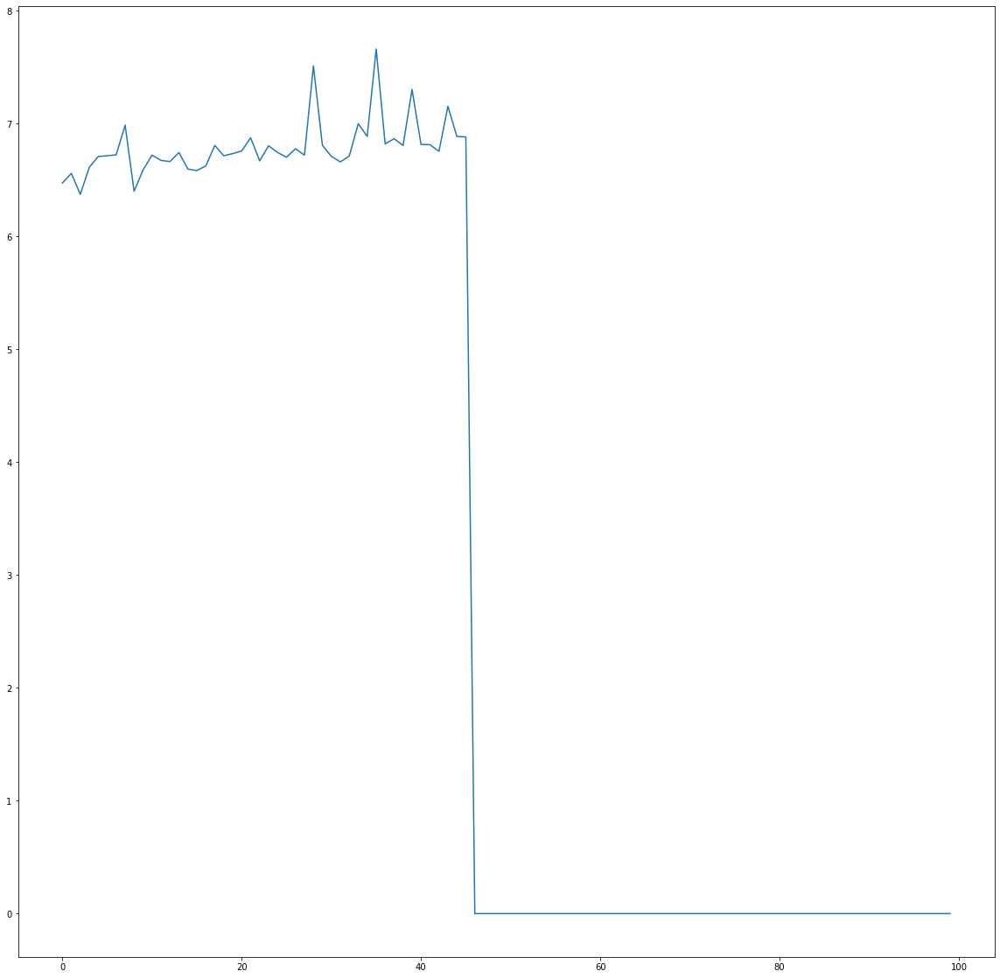

In [62]:
plt.figure(figsize=(20,20))
plt.plot(p_loss)
plt.figure(figsize=(20,20))
plt.plot(v_loss)

In [7]:
def psnr(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr
def bounds_hzf(upleft, hunit, wunit):
    up = upleft[0]
    left = upleft[1]
    down = up + hunit
    right = left + wunit
    return up, down, left, right
def getdeno_hzf(hbound, wbound, hlocate, wlocate, ratio):
    hdist = min(hlocate+1, hbound-hlocate)
    wdist = min(wlocate+1, wbound-wlocate)
    mulhw = hdist*wdist
    return min(mulhw, min(hdist,wdist)*ratio, ratio**2)
def patchify(img, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    height, width = img.shape
    if not goback:
        hamount, wamount = int((height-hsize)/hstep)+1, int((width-wsize)/wstep)+1
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = img[u:d, l:r]
    else:
        newh, neww = height+hsize-hstep, width+wsize-wstep
        extend_img = np.zeros((newh, neww))
        extend_img[0:height, 0:width] = img[:, :]
        extend_img[height:newh, 0:width] = img[0:(newh-height), :]
        extend_img[0:height, width:neww] = img[:, 0:(neww-width)]
        extend_img[height:newh, width:neww] = img[0:(newh-height), 0:(neww-width)]
        hamount, wamount = int(height/hstep), int(width/wstep)
        all_patches = np.zeros((hamount, wamount, hsize, wsize))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                all_patches[i, j, :, :] = extend_img[u:d, l:r]
    return all_patches

def unpatchify(pch, hsize, wsize, hstep, wstep, goback=0):  # goback=0 means 12->23->34; goback=1 means 12->23->34->41.
    hamount, wamount = pch.shape[0], pch.shape[1]
    if not goback:
        height, width = int((hamount-1)*hstep+hsize), int((wamount-1)*wstep+wsize)
        merged_img = np.zeros((height, width))
        for i in range(0, hamount):
            for j in range(0, wamount):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    else:
        height, width = int(hamount*hstep), int(wamount*wstep)
        hamount_true, wamount_true = hamount-int(hsize/hstep)+1, wamount-int(wsize/wstep)+1
        merged_img = np.zeros((height, width))
        for i in range(0, hamount_true):
            for j in range(0, wamount_true):
                u, d, l, r = bounds_hzf((i*hstep, j*wstep), hsize, wsize)
                merged_img[u:d, l:r] = merged_img[u:d, l:r] + pch[i, j, :, :]
    
    blockh, blockw, ratio = int(height/hstep), int(width/wstep), int(hsize/hstep)
    for ij in range(0, blockh):
        for ji in range(0, blockw):
            uu, dd, ll, rr = bounds_hzf((ij*hstep, ji*wstep), hstep, wstep)
            merged_img[uu:dd, ll:rr] = merged_img[uu:dd, ll:rr] / getdeno_hzf(blockh, blockw, ij, ji, ratio)
    return merged_img

In [1]:
low_path = './image/image_origin/low/0685.npy'
high_path = './image/image_origin/high/0685.npy'
low = np.abs(np.load(low_path))
high = np.abs(np.load(high_path))
plt.figure(figsize=(20,20))
plt.imshow(low,vmax=255)
plt.colorbar()
plt.figure(figsize=(20,20))
plt.imshow(high,vmax=255)
plt.colorbar()
patch_set = patchify(low,64,64,16,16,goback=0)
patch_high = patchify(high,64,64,16,16,goback=0)
shape = patch_set.shape
print(patch_set.shape)


# low_path = './T2_data/new_image.npy'
# low = np.abs(np.load(low_path))
# plt.figure(figsize=(20,20))
# plt.imshow(low)
# plt.colorbar()
# patch_set = patchify(low,64,64,16,16,goback=0)
# print(patch_set.shape)

NameError: name 'np' is not defined

In [63]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = UNet(n_channels=1, n_classes=1, bilinear=False)
net.load_state_dict(torch.load('MODEL_ori_abs_bl.pth', map_location=device),strict=True)

<All keys matched successfully>

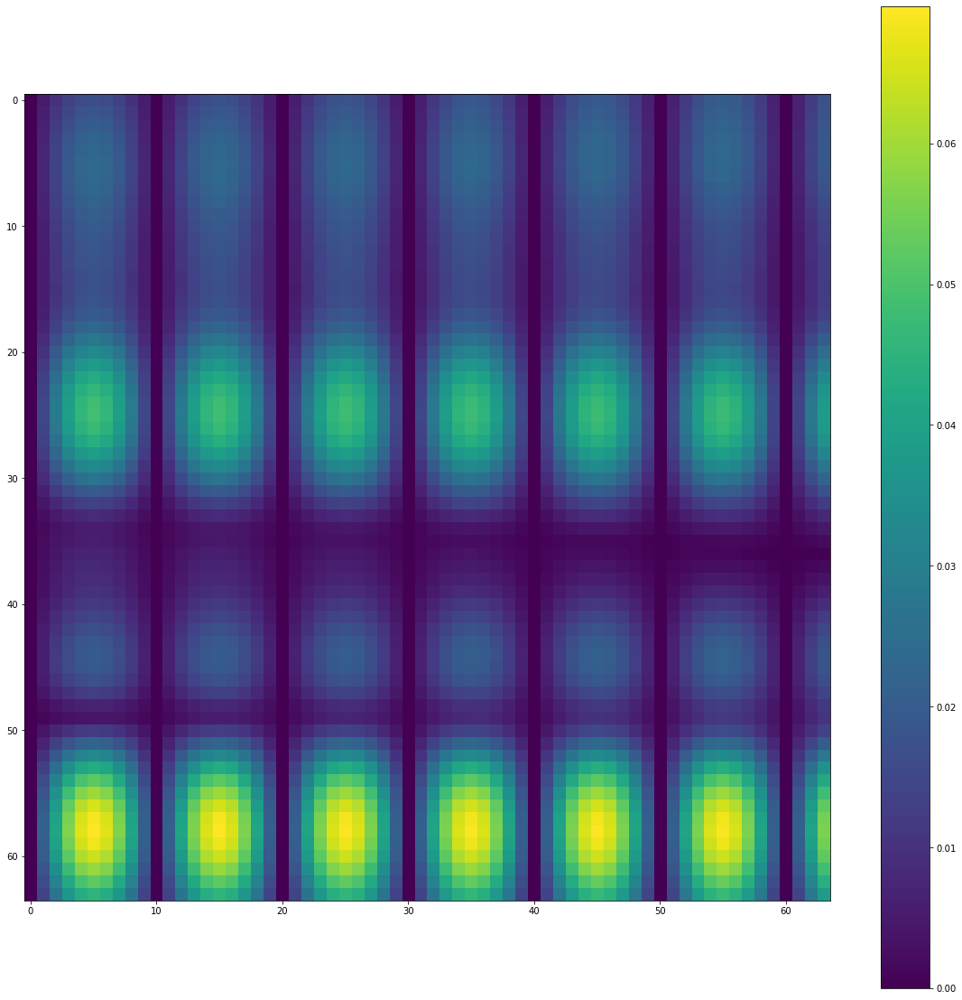

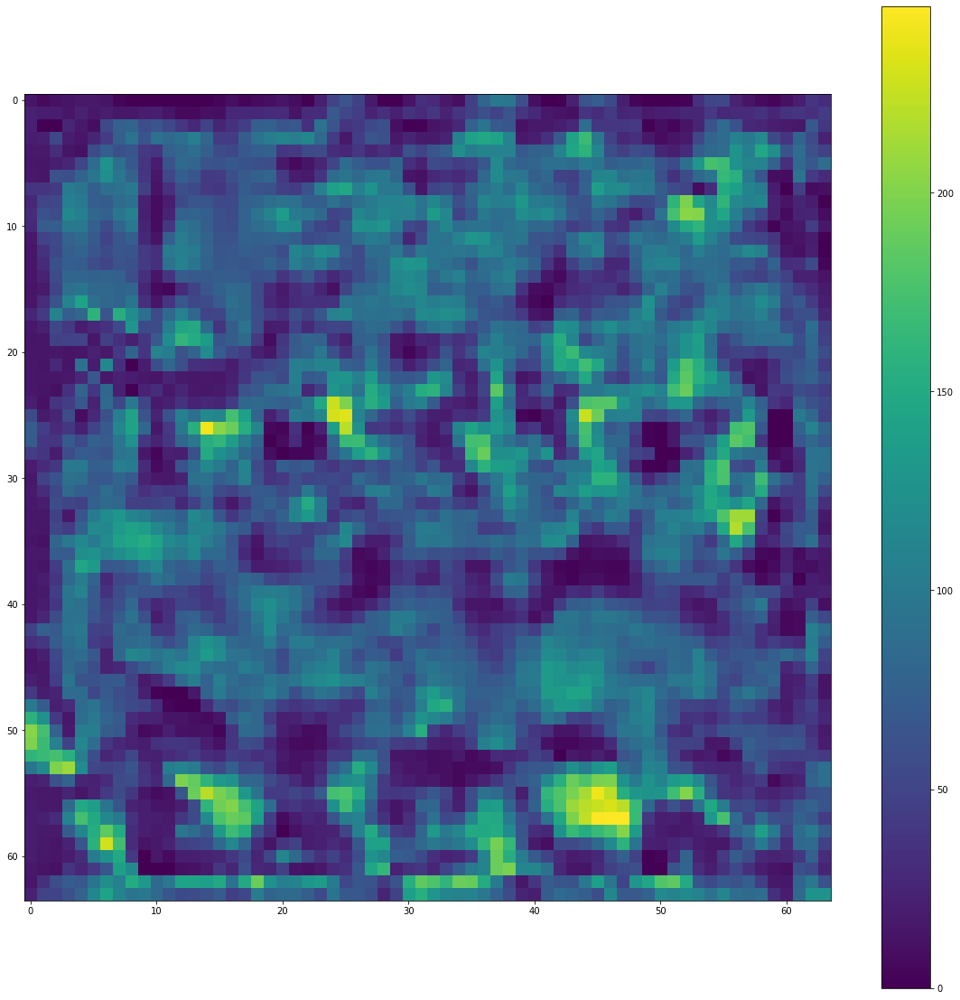

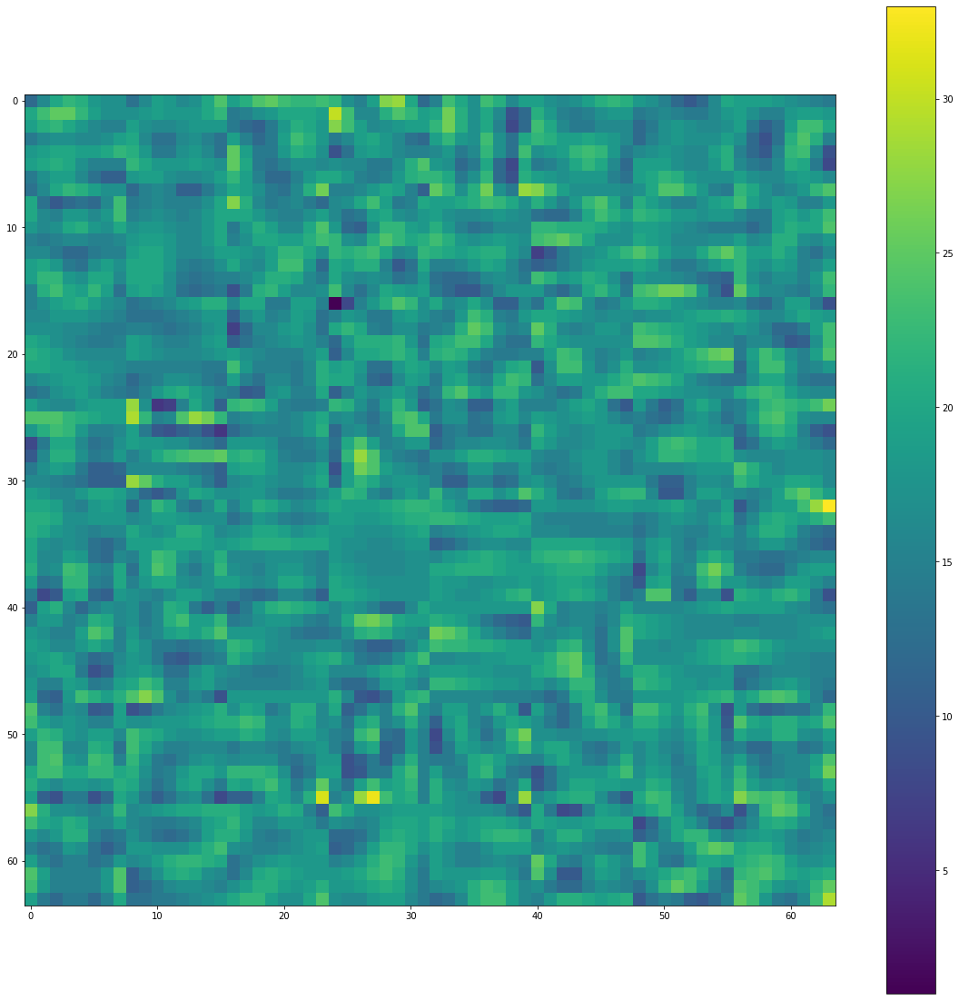

In [64]:
i = 0
j = 0
pat = patch_set[i,j,:,:]
high_pat = patch_high[i,j,:,:]
plt.figure(figsize=(20,20))
plt.imshow(pat)
plt.colorbar()

PAT = pat[np.newaxis,np.newaxis,...]/255.0
pat_tensor = torch.as_tensor(PAT.copy()).float().contiguous()
with torch.no_grad():
    masks_pred = net(pat_tensor)
    pred_pat = masks_pred.detach().numpy()[0, 0, :, :]
plt.figure(figsize=(20,20))
# plt.imshow(pred_pat)
plt.imshow(pred_pat)#,vmax = np.max(pat),vmin=np.min(pat))
plt.colorbar()

plt.figure(figsize=(20,20))
plt.imshow(high_pat)#,vmax = np.max(pat),vmin=np.min(pat))
plt.colorbar()

In [9]:
print('Original:',psnr(pat,high_pat))
print('Trained:',psnr(pred_pat,high_pat))

Original: 29.13026483544303
Trained: 27.451972414533834


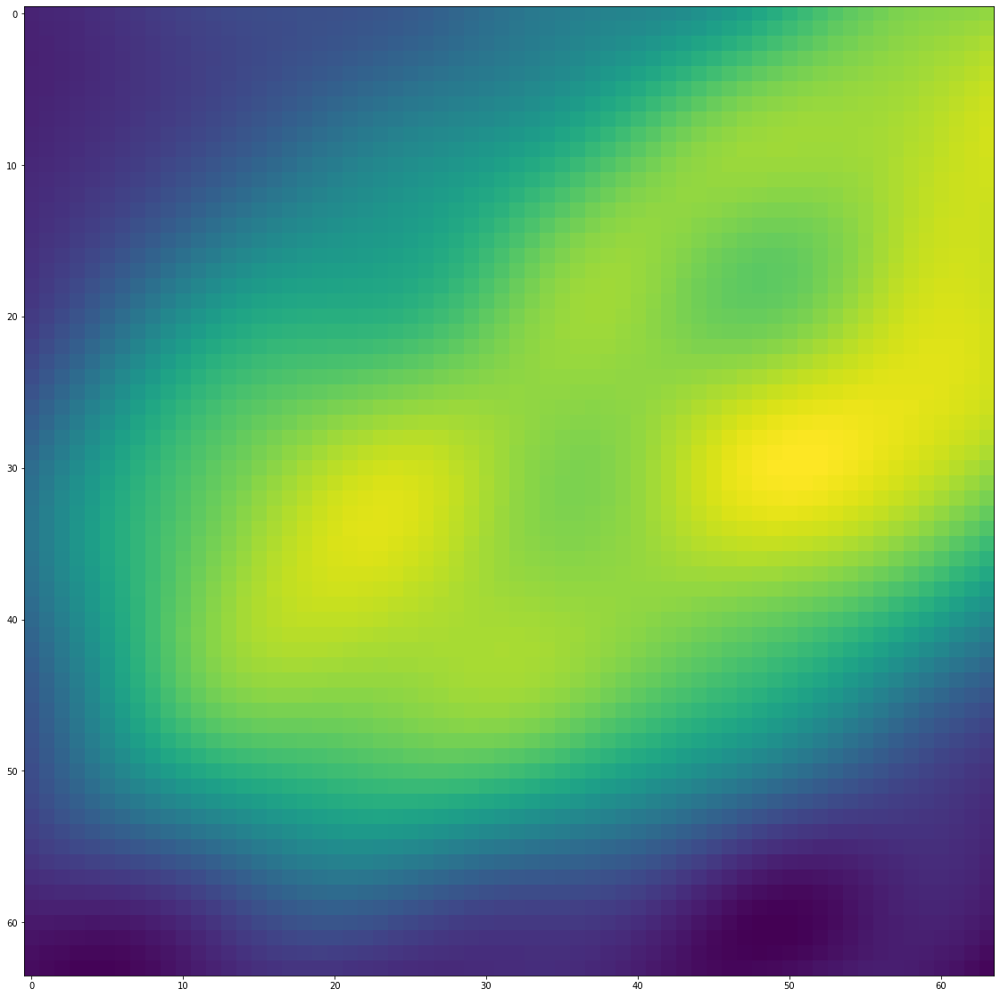

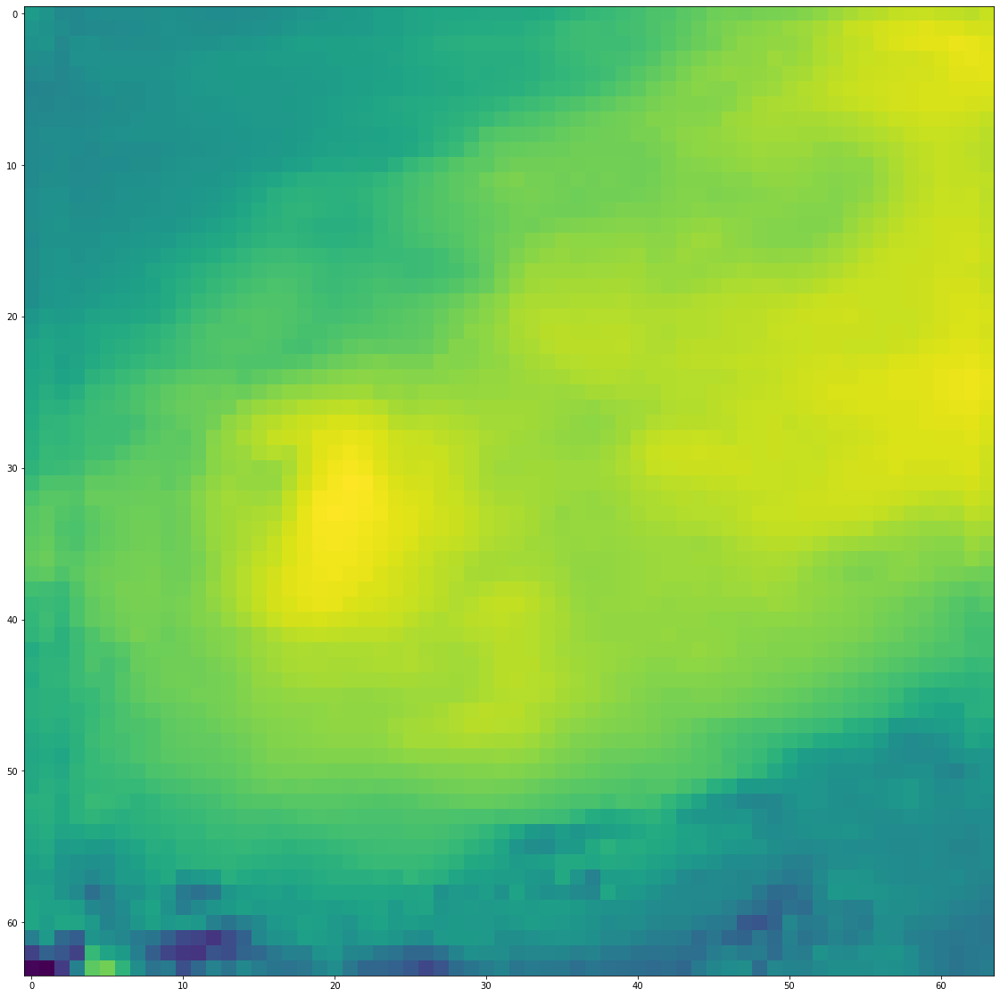

In [25]:
i = 36
j = 48
pat = patch_set[i,j,:,:]
high_pat = patch_high[i,j,:,:]
plt.figure(figsize=(20,20))
plt.imshow(pat)

# plt.colorbar()

PAT = pat[np.newaxis,np.newaxis,...]/255.0
pat_tensor = torch.as_tensor(PAT.copy()).float().contiguous()
with torch.no_grad():
    masks_pred = net(pat_tensor)
    pred_pat = masks_pred.detach().numpy()[0, 0, :, :]
plt.figure(figsize=(20,20))
plt.imshow(pred_pat)

# plt.colorbar()
# plt.figure(figsize=(20,20))
# plt.imshow(high_pat,vmax = np.max(pred_pat),vmin=np.min(pred_pat))
# plt.colorbar()

In [37]:
img = np.load('./image/image_nature/high/0043.npy')

In [38]:
print(np.max(img),np.min(img))

255 1
